In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import glob
from tensorflow import keras, GradientTape
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Conv2D, Activation, Input, UpSampling2D, BatchNormalization, PReLU, Add, Lambda, LeakyReLU, Flatten
from tensorflow.keras import optimizers, losses, metrics
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import plot_model
from tensorflow.keras.applications import vgg19
from tensorflow.keras.applications import VGG19
import os


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [4]:
HR_dir = '../input/super-image-resolution/Data/HR/' # 고해상도 디렉토리 
LR_dir = '../input/super-image-resolution/Data/LR/' # 저해상도 디렉토리

def load_img(directory):
    img = []
    for img_dir in sorted(glob.glob(directory+str('/*'))):
        tmp = plt.imread(img_dir)
#         tmp = cv2.resize(tmp,dsize=(384,384), interpolation=cv2.INTER_CUBIC)
        img.append(tmp)
    img = np.array(img)
    return img
HR_img = load_img(HR_dir)
LR_img = load_img(LR_dir)

print(f'HR Shape : {HR_img.shape}')
print(f'LR Shape : {LR_img.shape}')

HR Shape : (100, 384, 384, 3)
LR Shape : (100, 96, 96, 3)


In [5]:
LR_train, LR_val, HR_train, HR_val = train_test_split(LR_img, HR_img, test_size=0.1)
print(LR_train.shape, HR_train.shape)
print(LR_val.shape, HR_val.shape)

(90, 96, 96, 3) (90, 384, 384, 3)
(10, 96, 96, 3) (10, 384, 384, 3)


In [6]:
class SRGAN():
    '''Generator Part'''
    # residual_block for Generator
    def residual_block(self, x):
        out = Conv2D(filters=64, kernel_size=3, strides=1, padding='same')(x)
        out = BatchNormalization()(out)
        out = PReLU(shared_axes=[1,2])(out)
        out = Conv2D(64, 3, 1, 'same')(out)
        out = BatchNormalization()(out)
        return Add()([x, out])
    
    # upsample_block for Generator
    def upsample_block(self, x):
        out = Conv2D(256, 3, 1, 'same')(x)
        out = Lambda(lambda x: tf.nn.depth_to_space(x, 2))(out)
        return PReLU(shared_axes=[1,2])(out)

    # Build Generator
    def generator(self):
        input_layer = Input((None, None, 3))
    
        out = Conv2D(64, 9, 1, 'same')(input_layer)
        out = residual = PReLU(shared_axes=[1,2])(out)

        for _ in range(5):
            out = self.residual_block(out)

        out = Conv2D(64, 3, 1, 'same')(out)
        out = BatchNormalization()(out)
        out = Add()([residual, out])

        for _ in range(2):
            out = self.upsample_block(out)

        out = Conv2D(3, 9, 1, 'same', activation='tanh')(out)
        return Model(input_layer, out)
    
    '''Discriminator Part'''
    # discriminator_block for Discriminator
    def discriminator_block(self, x, n_filters):
        out = Conv2D(n_filters, 3, 1, 'same')(x)
        out = BatchNormalization()(out)
        out = LeakyReLU()(out)
        out = Conv2D(n_filters, 3, 2, 'same')(out)
        out = BatchNormalization()(out)
        return LeakyReLU()(out)
    
    def discriminator(self):
        input_layer = Input((None, None, 3))
        out = Conv2D(64, 3, 1, 'same')(input_layer)
        out = LeakyReLU()(out)
        out = Conv2D(64, 3, 2, 'same')(out)
        out = BatchNormalization()(out)
        out = LeakyReLU()(out)

        for n_filters in [128, 256, 512]:
            out = self.discriminator_block(out, n_filters)

        # out = Flatten()(out)

        out = Dense(1024)(out)
        out = LeakyReLU()(out)
        out = Dense(1, activation='sigmoid')(out)
        return Model(input_layer, out)
        

    

In [7]:
from tensorflow.keras.losses import MeanSquaredError, BinaryCrossentropy
from tensorflow import reduce_mean
from tensorflow.keras.losses import Reduction

In [8]:
class Losses:
    def __init__(self):
        pass
    
    def bce_loss(self, real, pred):
        bce = BinaryCrossentropy()
        loss = bce(real, pred)
        return loss
    
    def mse_loss(self, real, pred):
        mse = MeanSquaredError()
        loss = mse(real, pred)
        return loss

In [9]:
class SRGANTraining(Model):
    def __init__(self, generator, discriminator, vgg, batch_size):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.vgg = vgg
        self.batch_size = batch_size
    def compile(self, generator_optimizer, discriminator_optimizer, bce_loss, mse_loss):
        super().compile()
        self.generator_optimizer = generator_optimizer
        self.discriminator_optimizer = discriminator_optimizer

        self.bce_loss = bce_loss
        self.mse_loss = mse_loss
    
    def train_step(self, images):
        (lr_images, hr_images) = images
        lr_images = tf.cast(lr_images, tf.float32)
        hr_images = tf.cast(hr_images, tf.float32)

        sr_images = self.generator(lr_images)

        with GradientTape() as tape:

            ''' SRGAN discriminator loss '''
            sr_preds = self.discriminator(sr_images)
            hr_preds = self.discriminator(hr_images)
            d_loss = self.bce_loss(tf.ones_like(hr_preds), hr_preds) + self.bce_loss(tf.zeros_like(sr_preds), sr_preds)


        grads = tape.gradient(d_loss, self.discriminator.trainable_variables)
        
        self.discriminator_optimizer.apply_gradients(zip(grads, self.discriminator.trainable_variables))

        with GradientTape() as tape:
            fake_images = self.generator(lr_images)
            raw_preds = self.discriminator(fake_images)
            real_preds = self.discriminator(hr_images)
            g_loss = self.bce_loss(tf.ones_like(raw_preds), raw_preds)

            sr_VGG = tf.keras.applications.vgg19.preprocess_input(fake_images)
            sr_VGG = self.vgg(sr_VGG) / 12.75
            hr_VGG = tf.keras.applications.vgg19.preprocess_input(hr_images)
            hr_VGG = self.vgg(hr_VGG) / 12.75

            cont_loss = self.mse_loss(hr_VGG, sr_VGG)
            perc_loss = cont_loss + 1e-3*g_loss


        grads = tape.gradient(perc_loss, self.generator.trainable_variables)
        self.generator_optimizer.apply_gradients(zip(grads, self.generator.trainable_variables))
        return {"d_loss": d_loss, "g_loss": g_loss, "perc_loss": perc_loss}


In [10]:


class VGG:
    def build():
        vgg = VGG19(input_shape=(None, None, 3), weights="imagenet", include_top=False)
        model = Model(vgg.input, vgg.layers[20].output)
        return model

In [11]:
BASE_IMAGE_PATH = "Samples_save"
os.makedirs(BASE_IMAGE_PATH, exist_ok=True)

In [12]:
# training specs
PRETRAIN_LR = 1e-4
FINETUNE_LR = 3e-5
PRETRAIN_EPOCHS = 1500
FINETUNE_EPOCHS = 1000
TRAIN_BATCH_SIZE = 10
INFER_BATCH_SIZE = 10

In [13]:
os.makedirs("model1", exist_ok=True)

gen_model_path = "model1/gen_model.h5"
SRGAN_model_path = "model1/SRGAN_model.h5"

In [14]:
losses = Losses()
srgan = SRGAN()
pre_generator = srgan.generator()
# generator = SRGAN.generator()
pre_generator.compile(optimizer=Adam(learning_rate=PRETRAIN_LR), loss=losses.mse_loss)
print("[INFO] pretraining SRGAN generator ...")
pre_generator.fit(LR_train, HR_train, epochs=PRETRAIN_EPOCHS, batch_size=TRAIN_BATCH_SIZE)
pre_generator.save(gen_model_path)

[INFO] pretraining SRGAN generator ...
Epoch 1/1500
9/9 [==============================] - 19s 282ms/step - loss: 0.1931
Epoch 2/1500
9/9 [==============================] - 3s 279ms/step - loss: 0.0455
Epoch 3/1500
9/9 [==============================] - 3s 279ms/step - loss: 0.0349
Epoch 4/1500
9/9 [==============================] - 3s 278ms/step - loss: 0.0297
Epoch 5/1500
9/9 [==============================] - 2s 278ms/step - loss: 0.0242
Epoch 6/1500
9/9 [==============================] - 3s 280ms/step - loss: 0.0216
Epoch 7/1500
9/9 [==============================] - 3s 280ms/step - loss: 0.0225
Epoch 8/1500
9/9 [==============================] - 3s 280ms/step - loss: 0.0202
Epoch 9/1500
9/9 [==============================] - 3s 282ms/step - loss: 0.0191
Epoch 10/1500
9/9 [==============================] - 3s 281ms/step - loss: 0.0186
Epoch 11/1500
9/9 [==============================] - 3s 279ms/step - loss: 0.0180
Epoch 12/1500
9/9 [==============================] - 3s 279ms/step 

In [15]:
low_shape = (96, 96, 3)
high_shape = (384, 384, 3)

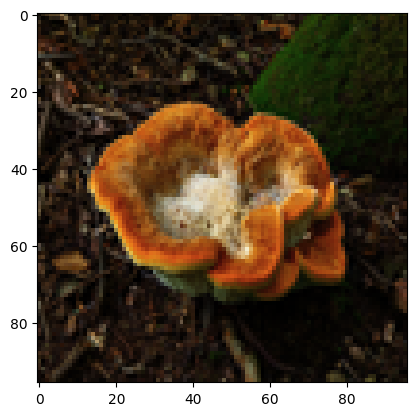

In [16]:
plt.imshow(LR_val[0])

1/1 [==============================] - 0s 479ms/step


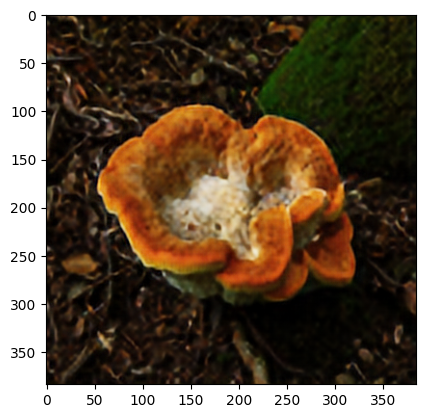

In [17]:
from tensorflow.keras.preprocessing.image import array_to_img
srgan_pre_gen_pred = pre_generator.predict(np.expand_dims(LR_val[0], axis=0))
plt.imshow(srgan_pre_gen_pred.reshape(high_shape))

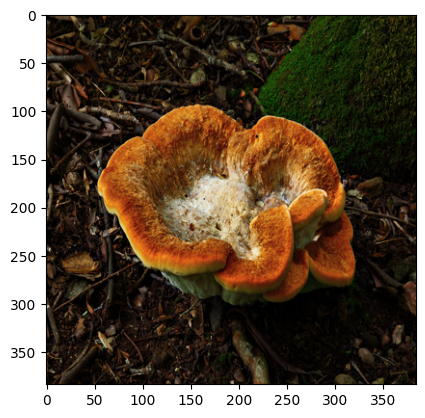

In [18]:
plt.imshow(HR_val[0])

In [19]:
from keras.models import load_model
losses = Losses()
pre_generator = load_model(gen_model_path, custom_objects={'mse_loss': losses.mse_loss})
vgg = VGG.build()
discriminator = srgan.discriminator()
adv_srgan = SRGANTraining(generator=pre_generator, discriminator=discriminator, vgg=vgg, batch_size=TRAIN_BATCH_SIZE)
adv_srgan.compile(
    discriminator_optimizer=Adam(learning_rate=FINETUNE_LR), 
    generator_optimizer=Adam(learning_rate=FINETUNE_LR), 
    bce_loss=losses.bce_loss, 
    mse_loss=losses.mse_loss)

print("[INFO] training SRGAN ...")
adv_srgan.fit(LR_train, HR_train, epochs=FINETUNE_EPOCHS, batch_size=TRAIN_BATCH_SIZE)

print("[INFO] saving SRGAN generator to {}...".format(SRGAN_model_path))
adv_srgan.generator.save(SRGAN_model_path)


80134624/80134624 [==============================] - 0s 0us/step
[INFO] training SRGAN ...
Epoch 1/1000
9/9 [==============================] - 29s 1s/step - d_loss: 1.3861 - g_loss: 0.6892 - perc_loss: 6.8969e-04
Epoch 2/1000
9/9 [==============================] - 9s 1s/step - d_loss: 1.3872 - g_loss: 0.6897 - perc_loss: 6.9022e-04
Epoch 3/1000
9/9 [==============================] - 9s 1s/step - d_loss: 1.3838 - g_loss: 0.7154 - perc_loss: 7.1588e-04
Epoch 4/1000
9/9 [==============================] - 9s 1s/step - d_loss: 1.3636 - g_loss: 0.7305 - perc_loss: 7.3100e-04
Epoch 5/1000
9/9 [==============================] - 9s 1s/step - d_loss: 1.4441 - g_loss: 0.6481 - perc_loss: 6.4909e-04
Epoch 6/1000
9/9 [==============================] - 9s 1s/step - d_loss: 1.3842 - g_loss: 0.6807 - perc_loss: 6.8383e-04
Epoch 7/1000
9/9 [==============================] - 9s 1s/step - d_loss: 1.4241 - g_loss: 0.7557 - perc_loss: 7.6432e-04
Epoch 8/1000
9/9 [==============================] - 9s 1s/ste

In [20]:
lr_image, hr_image = LR_val, HR_val
print("[INFO] loading the pre-trained and fully trained SRGAN model...")
srgan_pre_gen = load_model(gen_model_path, compile=False)
srgan_gen = load_model(SRGAN_model_path, compile=False)


[INFO] loading the pre-trained and fully trained SRGAN model...


In [21]:
print("[INFO] making predictions with pre-trained and fully trained SRGAN model...")
srgan_pre_gen_pred = srgan_pre_gen.predict(lr_image)
srgan_gen_pred = srgan_gen.predict(lr_image)

[INFO] making predictions with pre-trained and fully trained SRGAN model...
1/1 [==============================] - 0s 290ms/step


In [22]:
from matplotlib.pyplot import subplots, savefig, title, xticks, yticks, show
from tensorflow.keras.preprocessing.image import array_to_img
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import os

def zoom_into_images(image, imageTitle):
    (fig, ax) = subplots()
    im = ax.imshow(array_to_img(image[::-1]), origin="lower")
    title(imageTitle)

    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(array_to_img(image[::-1]), origin="lower")

    (x1, x2, y1, y2) = 20, 40, 20, 40

    axins.set_xlim(x1, x2)

    axins.set_ylim(y1, y2)

    yticks(visible=False)
    xticks(visible=False)

    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")

    imagePath = os.path.join(BASE_IMAGE_PATH, f"{imageTitle}.png")
    savefig(imagePath)

    show()

[INFO] plotting the SRGAN predictions...
[INFO] saving the SRGAN predictions to disk...


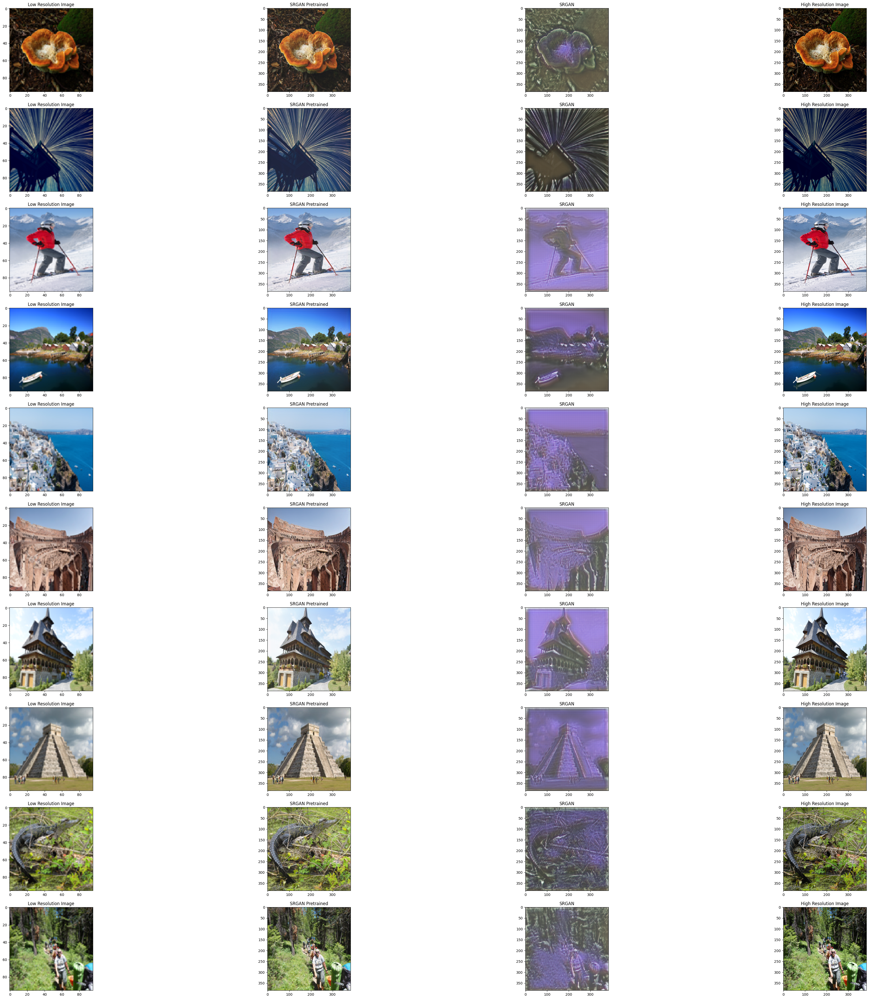

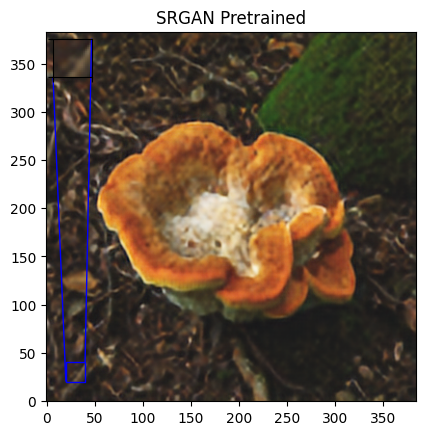

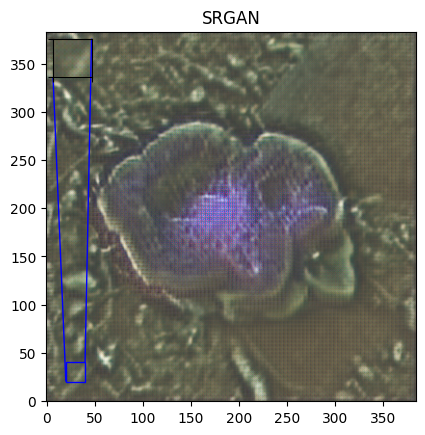

In [23]:
GRID_IMAGE_PATH = os.path.join(BASE_IMAGE_PATH, "grid.png")

print("[INFO] plotting the SRGAN predictions...")
(fig, axes) = subplots(nrows=INFER_BATCH_SIZE, ncols=4,figsize=(50, 50))

for (ax, lowRes, srPreIm, srGanIm, highRes) in zip(axes, 
                                                     lr_image, srgan_pre_gen_pred, 
                                                     srgan_gen_pred, hr_image):
    ax[0].imshow(array_to_img(lowRes))
    ax[0].set_title("Low Resolution Image")

    ax[1].imshow(array_to_img(srPreIm))
    ax[1].set_title("SRGAN Pretrained")

    ax[2].imshow(array_to_img(srGanIm))
    ax[2].set_title("SRGAN")

    ax[3].imshow(array_to_img(highRes))
    ax[3].set_title("High Resolution Image")

if not os.path.exists(BASE_IMAGE_PATH):
    os.makedirs(BASE_IMAGE_PATH)

print("[INFO] saving the SRGAN predictions to disk...")
fig.savefig(GRID_IMAGE_PATH)

zoom_into_images(srgan_pre_gen_pred[0], "SRGAN Pretrained")
zoom_into_images(srgan_gen_pred[0], "SRGAN")

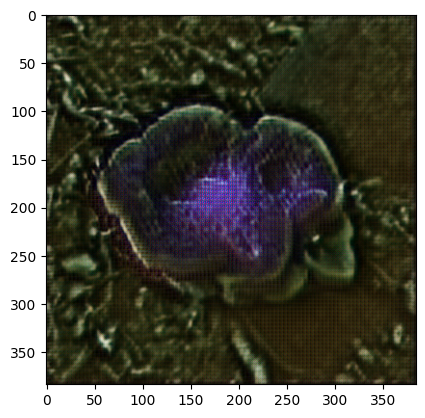

In [24]:
plt.imshow(srgan_gen_pred[0])

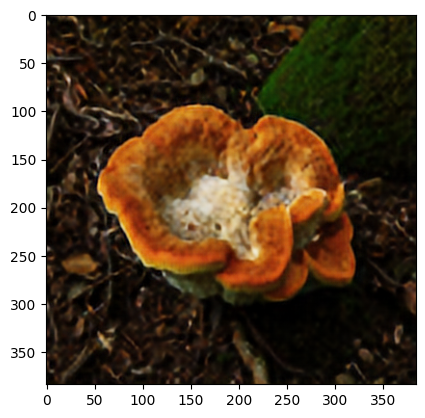

In [25]:
plt.imshow(srgan_pre_gen_pred[0])

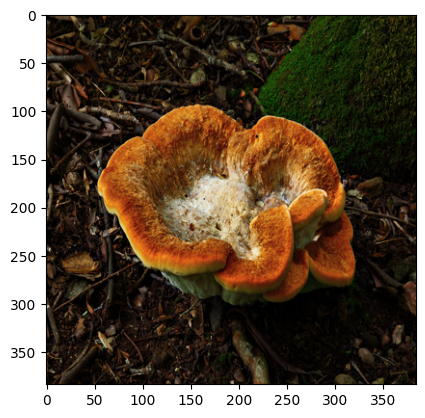

In [29]:
plt.imshow(hr_image[0])